In [1]:
import warnings
warnings.filterwarnings('ignore')

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from skimage.io import imread
from skimage.segmentation import mark_boundaries
from skimage.util import montage
from skimage.morphology import label

import gc
gc.enable()

## Exploring the data <a class="anchor"  id="h3"></a>

In [2]:
# Train and test directories
train_image_dir = '../input/airbus-ship-detection/train_v2'
test_image_dir = "../input/airbus-ship-detection/test_v2"

In [3]:
# Getting into train directory
train_images = os.listdir(train_image_dir)
train_images.sort()
print(f"Total of {len(train_images)} images in train directory.\nHere is how first five train_images looks like:- {train_images[:5]}")

Total of 192556 images in train directory.
Here is how first five train_images looks like:- ['00003e153.jpg', '0001124c7.jpg', '000155de5.jpg', '000194a2d.jpg', '0001b1832.jpg']


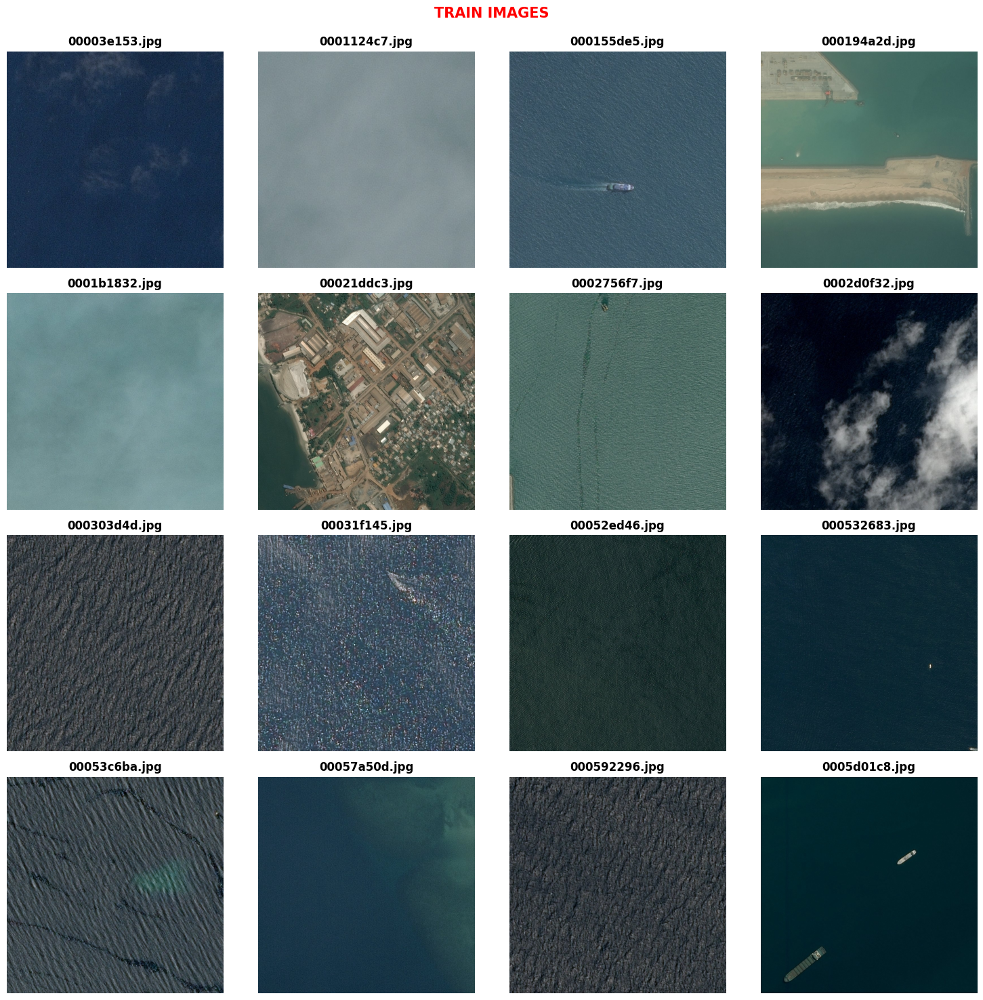

In [4]:
# Using for loop to generate different images to understand how data looks like
plt.figure(figsize=(15,15))
plt.suptitle('TRAIN IMAGES\n', weight = 'bold', fontsize = 15, color = 'r')
for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(imread(train_image_dir + "/" + train_images[i]))
    plt.title(f"{train_images[i]}", weight = 'bold')
    plt.axis('off')
plt.tight_layout()

- So there are many images here that has no ships and few that does have one or multiple ships.

In [5]:
# Train ships segmented masks
masks = pd.read_csv("../input/airbus-ship-detection/train_ship_segmentations_v2.csv")
masks.head(10)

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...
8,0001b1832.jpg,NaN
9,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...


In [6]:
row_rle = ['10 1', 
           '4 1 2 0 4 1', 
           '3 1 4 0 3 1', 
           '2 1 6 0 2 1',
           '1 1 2 0 1 1 2 0 1 1 2 0 1 1', 
           '1 1 8 0 1 1', 
           '3 1 1 0 2 1 1 0 3 1', 
           '2 1 1 0 1 1 2 0 1 1 1 0 2 1', 
           '1 1 1 0 1 1 1 0 2 1 1 0 1 1 1 0 1 1', 
           '10 1',
           'Total']

pixels = [len(row.split(" ")) for row in row_rle if row != 'Total']
sum_pixels = np.array(pixels).sum()
pixels.append(sum_pixels)

data = {
    'Row - RLE' : row_rle,
    'Pixels' : pixels
}

rle_df = pd.DataFrame(data)
rle_df.index+=1
rle_df


,Row - RLE,Pixels
1,10 1,2
2,4 1 2 0 4 1,6
3,3 1 4 0 3 1,6
4,2 1 6 0 2 1,6
5,1 1 2 0 1 1 2 0 1 1 2 0 1 1,14
6,1 1 8 0 1 1,6
7,3 1 1 0 2 1 1 0 3 1,10
8,2 1 1 0 1 1 2 0 1 1 1 0 2 1,14
9,1 1 1 0 1 1 1 0 2 1 1 0 1 1 1 0 1 1,18
10,10 1,2


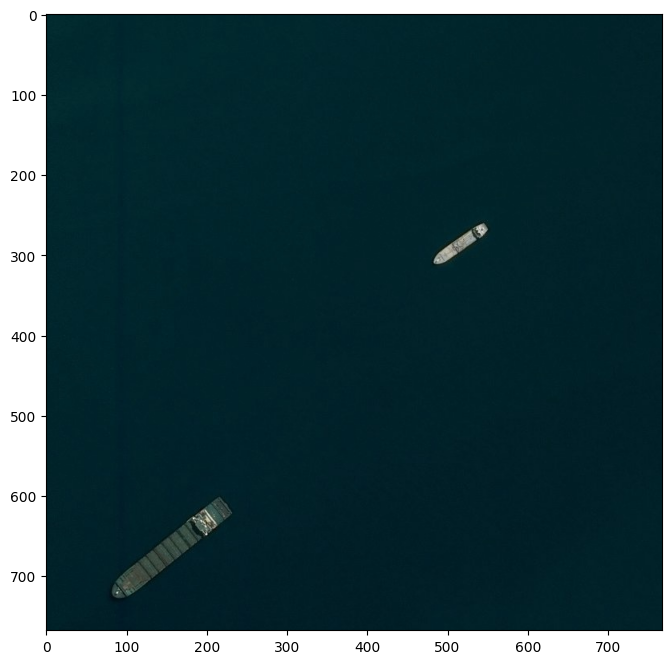

In [7]:
# Let us now see how it works for Image id:- 0005d01c8.jpg we have in the mask data frame

# Original image from training set
img_arr = imread(train_image_dir + '/' + '0005d01c8.jpg')
plt.figure(figsize=(15,8))
plt.imshow(img_arr)
plt.show()

In [8]:
img_arr.shape

(768, 768, 3)

In [9]:
# Filter out all 0005d01c8.jpg image ids and respective encoded data 
# 2 ships means 2 same image ids will be there!
rle_0 = masks.query('ImageId=="0005d01c8.jpg"')['EncodedPixels']
rle_0

29    56010 1 56777 3 57544 6 58312 7 59079 9 59846 ...
30    365871 1 366638 3 367405 6 368173 7 368940 9 3...
Name: EncodedPixels, dtype: object

In [10]:
# Make a list of each mask shown above also visualise whats happening!
mask_lst, ct = [], 1
for mask in rle_0:
    print(f"Mask {ct} -\n{mask}\n\n")
    mask_lst.append(mask)
    ct+=1

Mask 1 -
56010 1 56777 3 57544 6 58312 7 59079 9 59846 11 60613 14 61380 16 62148 17 62915 19 63682 22 64449 24 65216 26 65984 27 66751 30 67518 32 68285 34 69052 36 69820 38 70587 40 71354 42 72121 42 72888 42 73656 42 74423 42 75190 42 75957 42 76724 42 77492 42 78259 42 79026 42 79793 42 80560 42 81328 42 82095 42 82862 42 83629 42 84396 42 85164 42 85931 42 86698 42 87465 42 88232 42 89000 42 89767 42 90534 42 91301 42 92068 42 92836 42 93603 42 94370 42 95137 42 95904 42 96672 42 97439 42 98206 42 98973 42 99740 42 100508 42 101275 42 102042 42 102809 42 103576 42 104344 42 105111 42 105878 42 106645 42 107412 42 108180 42 108947 42 109714 42 110481 42 111249 41 112016 42 112783 42 113550 42 114317 42 115085 41 115852 42 116619 42 117386 42 118153 42 118921 41 119688 42 120455 42 121222 42 121989 42 122757 41 123524 42 124291 42 125058 42 125825 42 126593 42 127360 42 128127 42 128894 42 129661 42 130429 42 131196 42 131963 42 132730 42 133497 42 134265 42 135032 42 135799 42 1365

In [11]:
# Split and Display how the first mask in the list looks like
split = mask_lst[0].split()
print(split)

['56010', '1', '56777', '3', '57544', '6', '58312', '7', '59079', '9', '59846', '11', '60613', '14', '61380', '16', '62148', '17', '62915', '19', '63682', '22', '64449', '24', '65216', '26', '65984', '27', '66751', '30', '67518', '32', '68285', '34', '69052', '36', '69820', '38', '70587', '40', '71354', '42', '72121', '42', '72888', '42', '73656', '42', '74423', '42', '75190', '42', '75957', '42', '76724', '42', '77492', '42', '78259', '42', '79026', '42', '79793', '42', '80560', '42', '81328', '42', '82095', '42', '82862', '42', '83629', '42', '84396', '42', '85164', '42', '85931', '42', '86698', '42', '87465', '42', '88232', '42', '89000', '42', '89767', '42', '90534', '42', '91301', '42', '92068', '42', '92836', '42', '93603', '42', '94370', '42', '95137', '42', '95904', '42', '96672', '42', '97439', '42', '98206', '42', '98973', '42', '99740', '42', '100508', '42', '101275', '42', '102042', '42', '102809', '42', '103576', '42', '104344', '42', '105111', '42', '105878', '42', '10664

- This data shows start_pixels and lenghts where we can think ship to exist in the original image.
- For example, 56777 3 shows that pixels 56777, 56778, 56779 contributes to the ship.
- Our target is to create an image with these pixels labeled as 1 and remaining as 0.
- This is how we can produce a mask for respective image.

In [12]:
# Grab all the starting pixels and lenghts and convert it into integers using numpy 
starts, lengths = [np.array(x, dtype = int) for x in (split[::2], split[1::2])]
starts, lengths

(array([ 56010,  56777,  57544,  58312,  59079,  59846,  60613,  61380,
         62148,  62915,  63682,  64449,  65216,  65984,  66751,  67518,
         68285,  69052,  69820,  70587,  71354,  72121,  72888,  73656,
         74423,  75190,  75957,  76724,  77492,  78259,  79026,  79793,
         80560,  81328,  82095,  82862,  83629,  84396,  85164,  85931,
         86698,  87465,  88232,  89000,  89767,  90534,  91301,  92068,
         92836,  93603,  94370,  95137,  95904,  96672,  97439,  98206,
         98973,  99740, 100508, 101275, 102042, 102809, 103576, 104344,
        105111, 105878, 106645, 107412, 108180, 108947, 109714, 110481,
        111249, 112016, 112783, 113550, 114317, 115085, 115852, 116619,
        117386, 118153, 118921, 119688, 120455, 121222, 121989, 122757,
        123524, 124291, 125058, 125825, 126593, 127360, 128127, 128894,
        129661, 130429, 131196, 131963, 132730, 133497, 134265, 135032,
        135799, 136566, 137333, 138101, 138868, 139635, 140402, 

In [13]:
# Get the ending pixels. 
'''Examples:- 
56010 1 ---> Starts at 56010 and ends at 56010
56777 3 ---> Starts at 56777 and ends at 56779
57544 6 ---> Starts at 57544 and ends at 57549'''
ends = starts + lengths - 1
pd.DataFrame({
    'Starts' : starts,
    'Lengths' : lengths,
    'Ends' : ends
}).head(10)

,Starts,Lengths,Ends
0,56010,1,56010
1,56777,3,56779
2,57544,6,57549
3,58312,7,58318
4,59079,9,59087
5,59846,11,59856
6,60613,14,60626
7,61380,16,61395
8,62148,17,62164
9,62915,19,62933


In [16]:
# Create 1s in place of these pixels and rest should be 0
img = np.zeros(768*768, dtype = np.uint8)
for start, end in zip(starts, ends):
    img[start:end+1] = 1

In [17]:
# Check how output looks
img[56776:56781] # Should output 0, 1 , 1, 1 ,0 as we know 56777, 56778, 56779 ---> 1 and 5676, 56780 ---> 0

array([0, 1, 1, 1, 0], dtype=uint8)

In [18]:
# Copy-Paste this idea for another ship in the image
split_1 = mask_lst[1].split()                                                                # Split the mask into start_pixels and lengths
starts, lengths = [np.array(x, dtype = int) for x in (split_1[0:][::2], split_1[1:][::2])]   # Generate arrays from only starts and lengths
ends = starts + lengths - 1                                                                  # Start pixel to end pixel will be start - 1 + length
img1 = np.zeros(768*768, dtype = np.uint8)                                                   # 1D array containing all zeros
for start, end in zip(starts, ends):                                                         # For each start to end pair
    img1[start:end+1] = 1                                                                    # Convert the values from 0 to 1

In [19]:
# Reshaping both the ship masks and combining it to form the final mask!
img = img.reshape(768, 768)
img1 = img1.reshape(768, 768)
final = img+img1
print(final, '\n\n', final.shape, '\n\n', final.ndim)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]] 

 (768, 768) 

 2


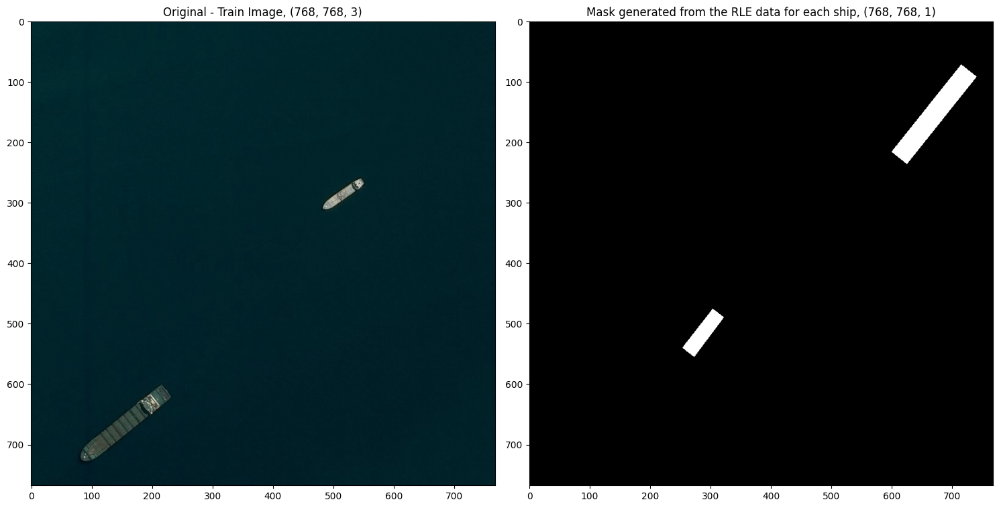

In [20]:
# Expand dimension of this array to have only 1 channel in the mask and visualise original and final mask
final = np.expand_dims(final, -1) # -1 means the last available dimenstion, in this case it is 2. Hence, on axis = 2 we will get 1.
original = imread(train_image_dir+'/'+train_images[15])
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.title(f"Original - Train Image, {original.shape}")
plt.imshow(original)
plt.subplot(1, 2, 2)
plt.title(f"Mask generated from the RLE data for each ship, {final.shape}")
plt.imshow(final, cmap = "gray")
plt.tight_layout()
plt.show()

- Oh, something is off!
- Our mask needs to be transposed. 

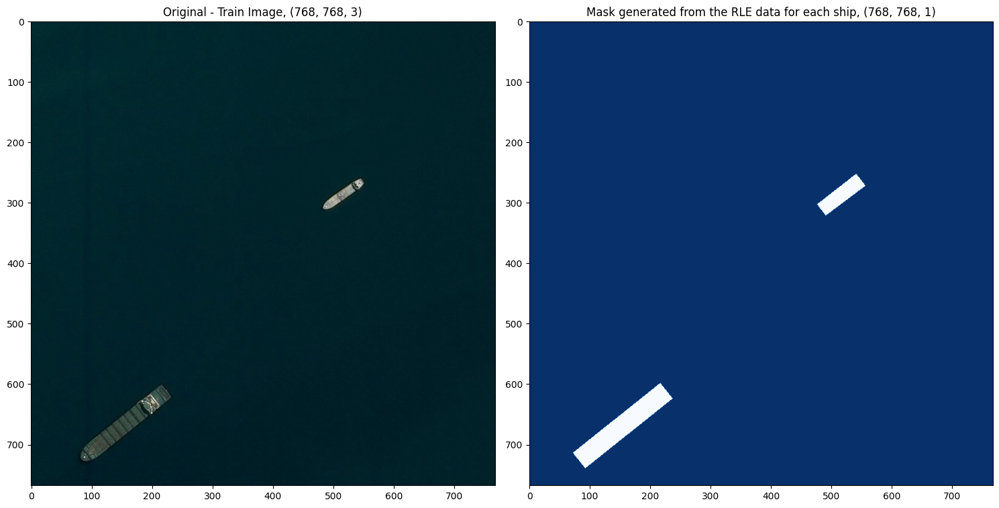

In [21]:
# Copy Paste the code from the prev cell with one change - Transpose!
img = img.reshape(768, 768).T     # Transpose the first ship mask
img1 = img1.reshape(768, 768).T   # Transpose the second ship mask
final = img+img1                  # Generate the final mask with two ships 
final = np.expand_dims(final, -1) 
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.title(f"Original - Train Image, {original.shape}")
plt.imshow(original)
plt.subplot(1, 2, 2)
plt.title(f"Mask generated from the RLE data for each ship, {final.shape}")
plt.imshow(final, cmap = "Blues_r")
plt.tight_layout()
plt.show()

- So this is how the EncodedPixels data for one image id looks like!
- We can build a function that can quickly generate such masks for all the EncodedPixels wrt to its ImageId.

In [22]:
# Define functions to do these tasks for all the training images
def rle_decode(mask_rle, shape=(768,768)):
    '''
    Input arguments -
    mask_rle: Mask of one ship in the train image
    shape: Output shape of the image array
    '''
    s = mask_rle.split()                                                               # Split the mask of each ship that is in RLE format
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]     # Get the start pixels and lengths for which image has ship
    ends = starts + lengths - 1                                                        # Get the end pixels where we need to stop
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)                                  # A 1D vec full of zeros of size = 768*768
    for lo, hi in zip(starts, ends):                                                   # For each start to end pixels where ship exists
        img[lo:hi+1] = 1                                                               # Fill those values with 1 in the main 1D vector
    '''
    Returns -
    Transposed array of the mask: Contains 1s and 0s. 1 for ship and 0 for background
    '''
    return img.reshape(shape).T                                                       

def masks_as_image(in_mask_list):
    '''
    Input - 
    in_mask_list: List of the masks of each ship in one whole training image
    '''
    all_masks = np.zeros((768, 768), dtype = np.int16)                                 # Creating 0s for the background
    for mask in in_mask_list:                                                          # For each ship rle data in the list of mask rle 
        if isinstance(mask, str):                                                      # If the datatype is string
            all_masks += rle_decode(mask)                                              # Use rle_decode to create one mask for whole image
    '''
    Returns - 
    Full mask of the training image whose RLE data has been passed as an input
    '''
    return np.expand_dims(all_masks, -1)

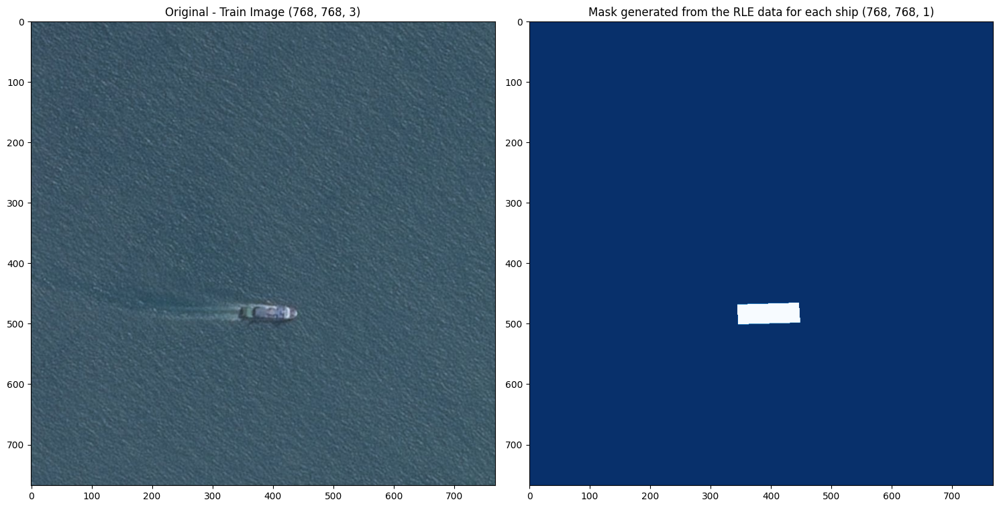

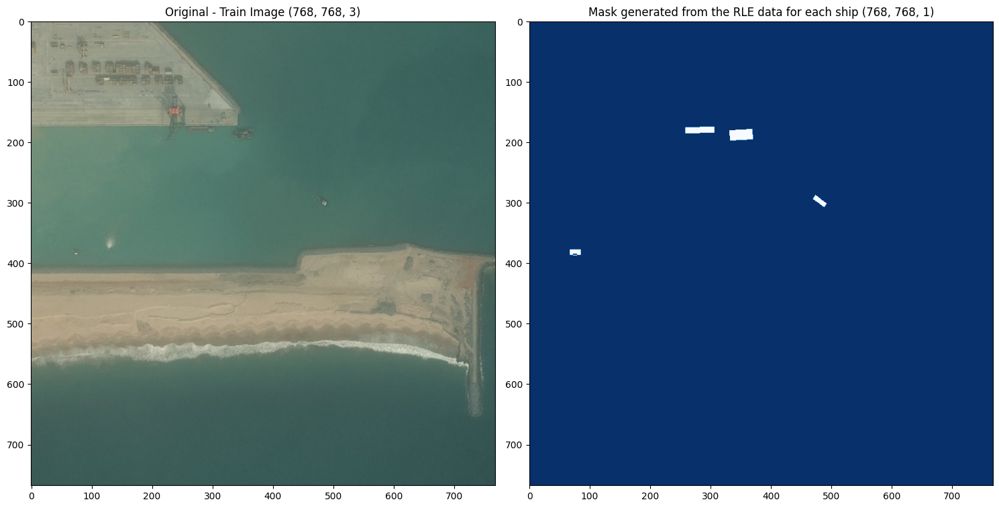

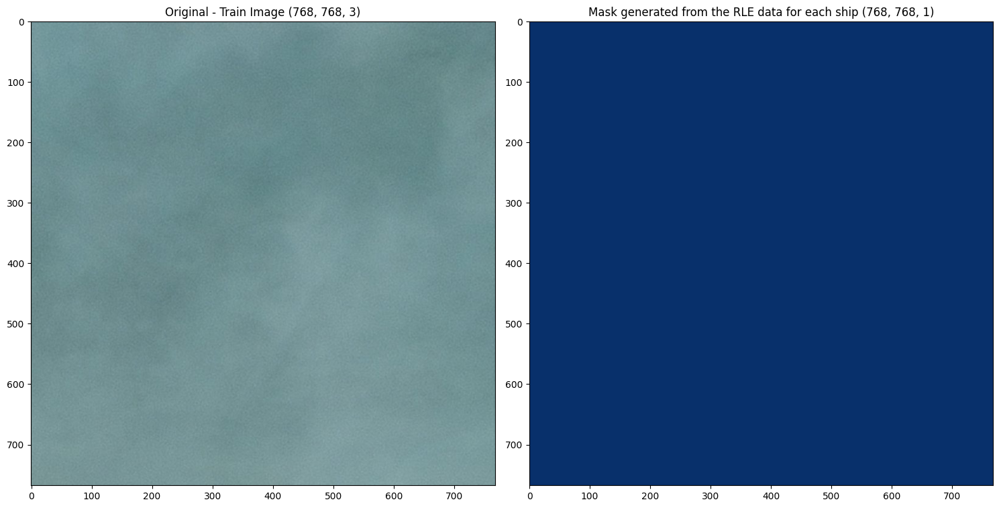

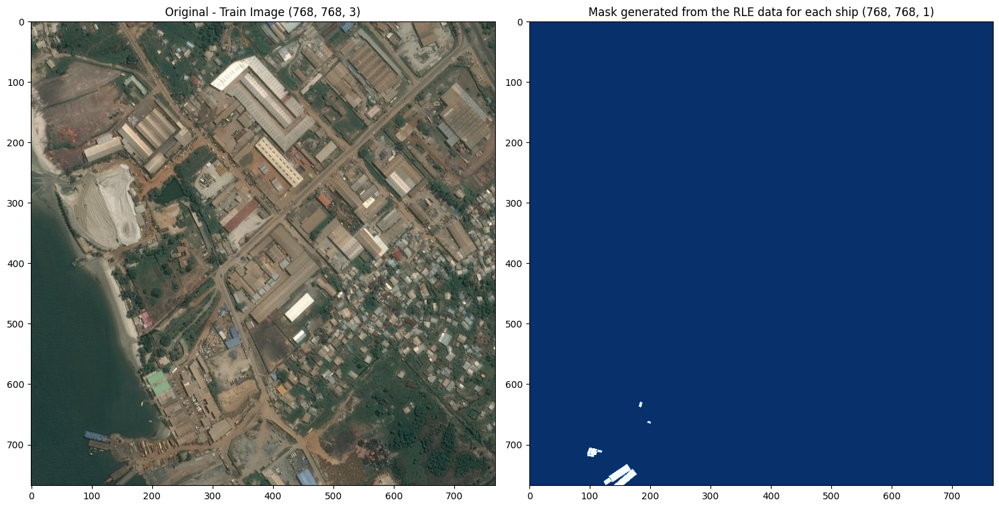

In [23]:
for num in [3, 4, 5, 6]:
    rle_0 = masks.query(f'ImageId=="{train_images[num-1]}"')['EncodedPixels']
    img_0 = masks_as_image(rle_0)
    original = imread(train_image_dir+"/"+train_images[num-1])
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1)
    plt.title(f"Original - Train Image {original.shape}")
    plt.imshow(original)
    plt.subplot(1, 2, 2)
    plt.title(f"Mask generated from the RLE data for each ship {final.shape}")
    plt.imshow(img_0, cmap = "Blues_r")
    plt.tight_layout()
    plt.show()

- We have succesfully constructed some functions that will take in the rle data and convert it into mask!
- We can now begin with spliting the data into train and validation.

## Preparing Train and Validation Data <a class="anchor"  id="h5"></a>

In [24]:
'''Note that NaN values in the EncodedPixels are of float type and everything else is a string type'''   

# Add a new feature to the masks data frame named as ship. If Encoded pixel in any row is a string, there is a ship else there isn't. 
masks['ships'] = masks['EncodedPixels'].map(lambda c_row: 1 if isinstance(c_row, str) else 0)
masks.head(9)

,ImageId,EncodedPixels,ships
0,00003e153.jpg,NaN,0
1,0001124c7.jpg,NaN,0
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,1
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...,1
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...,1
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...,1
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...,1
8,0001b1832.jpg,NaN,0


In [25]:
# Making a new data frame with unique image ids where we are summing up the ship counts
unique_img_ids = masks.groupby('ImageId').agg({'ships': 'sum'}).reset_index() 
unique_img_ids.index+=1 # Incrimenting all the index by 1
unique_img_ids.head()

,ImageId,ships
1,00003e153.jpg,0
2,0001124c7.jpg,0
3,000155de5.jpg,1
4,000194a2d.jpg,5
5,0001b1832.jpg,0


In [27]:
# Adding two new features to unique_img_ids data frame. If ship exists in image, val is 1 else 0. And it's vec form
unique_img_ids['has_ship'] = unique_img_ids['ships'].map(lambda x: 1.0 if x>0 else 0.0)
unique_img_ids.head()

,ImageId,ships,has_ship
1,00003e153.jpg,0,0.0
2,0001124c7.jpg,0,0.0
3,000155de5.jpg,1,1.0
4,000194a2d.jpg,5,1.0
5,0001b1832.jpg,0,0.0


In [28]:
# Check the size of the files. Will take some time to run as there are loads of files!!!
unique_img_ids['file_size_kb'] = unique_img_ids['ImageId'].map(lambda c_img_id: os.stat(os.path.join(train_image_dir, c_img_id)).st_size/1024)
'''os.stat is used to get status of the specified path. Here, st_size represents size of the file in bytes. Converting it into kB!'''

'os.stat is used to get status of the specified path. Here, st_size represents size of the file in bytes. Converting it into kB!'

In [29]:
# We can get rid of any images whose size is less than 35 Kb. As some of the files are corrupted! 
unique_img_ids[unique_img_ids.file_size_kb<35].head()

,ImageId,ships,has_ship,file_size_kb
85,001bfb70a.jpg,0,0.0,22.796875
359,0080bd6a5.jpg,0,0.0,14.327148
819,011589d1f.jpg,0,0.0,20.317383
1434,01df54887.jpg,0,0.0,16.492188
2342,0318fc519.jpg,0,0.0,13.289062


In [30]:
# Keep the files whose size > 35 kB
unique_img_ids = unique_img_ids[unique_img_ids.file_size_kb > 35]
unique_img_ids.head()

,ImageId,ships,has_ship,file_size_kb
1,00003e153.jpg,0,0.0,128.944336
2,0001124c7.jpg,0,0.0,76.059570
3,000155de5.jpg,1,1.0,147.625977
4,000194a2d.jpg,5,1.0,75.221680
5,0001b1832.jpg,0,0.0,95.627930


In [31]:
# Also, retrive the old masks data frame
masks.drop(['ships'], axis=1, inplace=True)
masks.index+=1 
masks.head()

,ImageId,EncodedPixels
1,00003e153.jpg,NaN
2,0001124c7.jpg,NaN
3,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
4,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
5,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


- Now, its the time to use the train_test_split.
- Stratify to split the dataset into train and test sets in a way that preserves the same proportions of examples in each class as observed in the original dataset.

In [32]:
# Train - Test split
from sklearn.model_selection import train_test_split                   
train_ids, valid_ids = train_test_split(unique_img_ids, test_size = 0.3, stratify = unique_img_ids['ships'])

In [33]:
# Create train data frame
train_df = pd.merge(masks, train_ids)

# Create test data frame
valid_df = pd.merge(masks, valid_ids)

In [34]:
print("There are ~")
print(train_df.shape[0], 'training masks,')
print(valid_df.shape[0], 'validation masks.')

There are ~
162047 training masks,
69439 validation masks.


In [35]:
'''
# Visualise the ship counts
plt.figure(figsize=(10, 6))
sns.countplot(train_df.ships)
plt.show()
'''


'\n# Visualise the ship counts\nplt.figure(figsize=(10, 6))\nsns.countplot(train_df.ships)\nplt.show()\n'

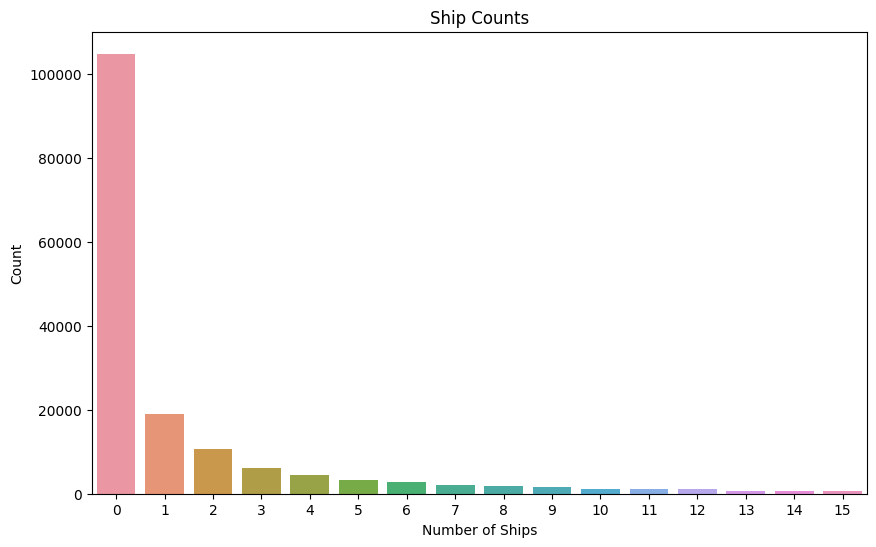

In [36]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Visualise the ship counts
plt.figure(figsize=(10, 6))
sns.countplot(data=train_df, x='ships')
plt.title('Ship Counts')
plt.xlabel('Number of Ships')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

- Oh!! Very huge imbalance in the data...
- We need to have a better balanced data!!!

## Random Undersampling to generate a better balanced data to work with

In [38]:
# Clipping the max value of grouped_ship_count to be 7, minimum to be 0
data = train_df
#train_df['grouped_ship_count'] = train_df.ships.map(lambda x: (x+1)//2).clip(0,7)
data['grouped_ship_count'] = train_df.ships.map(lambda x: (x+1)//2).clip(0,7)

In [39]:
# Check
#train_df.grouped_ship_count.value_counts()
data.grouped_ship_count.value_counts()

grouped_ship_count
0    104837
1     29713
2     10744
3      5995
4      3772
5      2710
6      2155
7      2121
Name: count, dtype: int64

#### Difference between head(n) and sample(n) in pandas
- df.head(n) returns only top n data from the df
- df.sample(n) returns random n data from the df

In [40]:
# Top 10 data
#train_df.head(10)
data.head(10)

,ImageId,EncodedPixels,ships,has_ship,file_size_kb,grouped_ship_count
0,00003e153.jpg,NaN,0,0.0,128.944336,0
1,0001124c7.jpg,NaN,0,0.0,76.059570,0
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1,1.0,147.625977,1
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,5,1.0,75.221680,3
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...,5,1.0,75.221680,3
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...,5,1.0,75.221680,3
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...,5,1.0,75.221680,3
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...,5,1.0,75.221680,3
8,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...,9,1.0,242.910156,5
9,00021ddc3.jpg,101361 1 102128 3 102896 4 103663 6 104430 9 1...,9,1.0,242.910156,5


In [41]:
# Random 10 data
#train_df.sample(10)
data.sample(10)

,ImageId,EncodedPixels,ships,has_ship,file_size_kb,grouped_ship_count
56732,59df77835.jpg,NaN,0,0.0,181.933594,0
70266,6f1a09ff9.jpg,NaN,0,0.0,203.222656,0
42038,42bfd79d6.jpg,NaN,0,0.0,170.968750,0
111583,b01fb4507.jpg,NaN,0,0.0,101.498047,0
49257,4e3f9df22.jpg,87802 5 88562 13 89326 17 90094 17 90862 18 91...,10,1.0,111.767578,5
27330,2b7414813.jpg,551566 1 552332 4 553099 6 553866 7 554632 10 ...,6,1.0,196.385742,3
50587,50659c7d5.jpg,236015 2 236779 6 237543 11 238307 15 239073 1...,2,1.0,91.328125,1
5930,09370552b.jpg,NaN,0,0.0,185.788086,0
59795,5eadafde2.jpg,388367 1 389134 4 389902 5 390669 7 391436 10 ...,1,1.0,115.700195,1
143539,e2d99d504.jpg,NaN,0,0.0,124.449219,0


In [42]:
# Random Under-Sampling ships
def sample_ships(in_df, base_rep_val=1500):
    '''
    Input Args:
    in_df - dataframe we want to apply this function
    base_val - random sample of this value to be taken from the data frame
    '''
    if in_df['ships'].values[0]==0:                                                 
        return in_df.sample(base_rep_val//3)  # Random 1500//3 = 500 samples taken whose ship count is 0 in an image 
    else:                                 
        return in_df.sample(base_rep_val)    # Random 1500 samples taken whose ship count is not 0 in an image

In [43]:
# Creating groups of ship counts and applying the sample_ships functions to randomly undersample the ships
#balanced_train_df = train_df.groupby('grouped_ship_count').apply(sample_ships)
balanced_train_df = data.groupby('grouped_ship_count').apply(sample_ships)
balanced_train_df.grouped_ship_count.value_counts() # In each group we have total of 1500 ships except 0 as we have decreased it even more to 500

grouped_ship_count
1    1500
2    1500
3    1500
4    1500
5    1500
6    1500
7    1500
0     500
Name: count, dtype: int64

In [44]:
# Explaining what we just did if still not clear
for i in range(8):
    df_val_counts = balanced_train_df[balanced_train_df.grouped_ship_count==i].ships.value_counts()
    print(f"Data frame for grouped ship count = {i}:-\n{df_val_counts}\nSum of Values:- {df_val_counts.values.sum()}\n\n")


Data frame for grouped ship count = 0:-
ships
0    500
Name: count, dtype: int64
Sum of Values:- 500


Data frame for grouped ship count = 1:-
ships
1    961
2    539
Name: count, dtype: int64
Sum of Values:- 1500


Data frame for grouped ship count = 2:-
ships
3    850
4    650
Name: count, dtype: int64
Sum of Values:- 1500


Data frame for grouped ship count = 3:-
ships
5    816
6    684
Name: count, dtype: int64
Sum of Values:- 1500


Data frame for grouped ship count = 4:-
ships
7    808
8    692
Name: count, dtype: int64
Sum of Values:- 1500


Data frame for grouped ship count = 5:-
ships
9     842
10    658
Name: count, dtype: int64
Sum of Values:- 1500


Data frame for grouped ship count = 6:-
ships
11    782
12    718
Name: count, dtype: int64
Sum of Values:- 1500


Data frame for grouped ship count = 7:-
ships
14    520
13    496
15    484
Name: count, dtype: int64
Sum of Values:- 1500




In [45]:
print(balanced_train_df.ships.isnull().sum())
print(balanced_train_df.ships.unique())


0
[ 0  1  2  3  4  6  5  7  8  9 10 11 12 13 15 14]


In [46]:
balanced_train_df = balanced_train_df.dropna(subset=['ships'])
# or
#balanced_train_df['ships'] = balanced_train_df['ships'].fillna(value)

In [50]:
balanced_train_df['ships'] = balanced_train_df['ships'].astype(int)


In [ ]:
'''
plt.figure(figsize = (15, 5))
plt.suptitle("Train Data", fontsize = 18, color = 'r', weight = 'bold')
plt.subplot(1, 2, 1)
import seaborn as sns
sns.countplot(train_df.ships, palette = 'Set2')
plt.title("Ship Counts - Before Balancing", color = 'm', fontsize = 15)
plt.ylabel("Count", color = 'tab:pink', fontsize = 13)
plt.xlabel("# Ships in an image", color = 'tab:pink', fontsize = 13)
plt.subplot(1, 2, 2)
sns.countplot(balanced_train_df.ships, palette = 'Set2')
plt.title("Ship Counts - After Balancing", color = 'm', fontsize = 15)
plt.xlabel("# Ships in an image", color = 'tab:pink', fontsize = 13)
plt.tight_layout()
'''

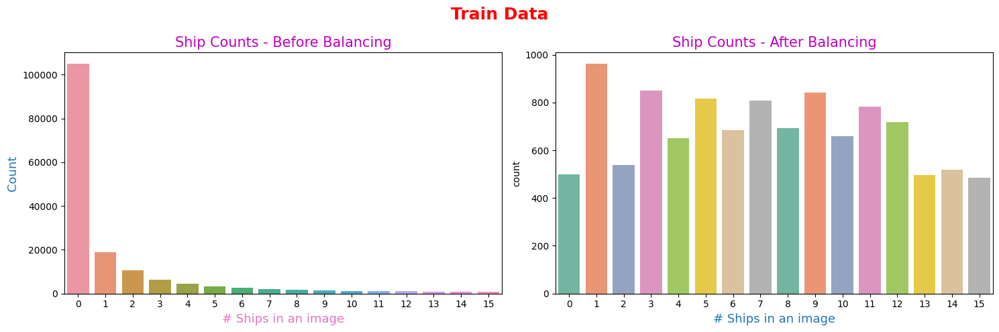

In [51]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure train_df and balanced_train_df have the 'ships' column and contain data
if 'ships' not in train_df.columns:
    raise ValueError("The 'ships' column is missing from train_df.")
if 'ships' not in balanced_train_df.columns:
    raise ValueError("The 'ships' column is missing from balanced_train_df.")

# Visualize the ship counts before and after balancing
plt.figure(figsize=(15, 5))
plt.suptitle("Train Data", fontsize=18, color='r', weight='bold')

plt.subplot(1, 2, 1)
sns.countplot(data=train_df, x='ships')
plt.title("Ship Counts - Before Balancing", color='m', fontsize=15)
plt.ylabel("Count", color='tab:blue', fontsize=13)
plt.xlabel("# Ships in an image", color='tab:pink', fontsize=13)

plt.subplot(1, 2, 2)
sns.countplot(data=balanced_train_df, x='ships', palette='Set2')
plt.title("Ship Counts - After Balancing", color='m', fontsize=15)
plt.xlabel("# Ships in an image", color='tab:blue', fontsize=13)

plt.tight_layout()
plt.show()

In [54]:
# Parameters
BATCH_SIZE = 4                 # Train batch size
EDGE_CROP = 16                 # While building the model
NB_EPOCHS = 2                  # Training epochs
GAUSSIAN_NOISE = 0.1           # To be used in a layer in the model
UPSAMPLE_MODE = 'SIMPLE'       # SIMPLE ==> UpSampling2D, else Conv2DTranspose
NET_SCALING = None             # Downsampling inside the network                        
IMG_SCALING = (1, 1)           # Downsampling in preprocessing
VALID_IMG_COUNT = 400          # Valid batch size
MAX_TRAIN_STEPS = 10         # Maximum number of steps_per_epoch in training

In [55]:
# Image and Mask Generator
def make_image_gen(in_df, batch_size = BATCH_SIZE):
    '''
    Inputs -
    in_df - data frame on which the function will be applied
    batch_size - number of training examples in one iteration
    '''
    all_batches = list(in_df.groupby('ImageId'))                             # Group ImageIds and create list of that dataframe
    out_rgb = []                                                             # Image list
    out_mask = []                                                            # Mask list
    while True:                                                              # Loop for every data
        np.random.shuffle(all_batches)                                       # Shuffling the data
        for c_img_id, c_masks in all_batches:                                # For img_id and msk_rle in all_batches
            rgb_path = os.path.join(train_image_dir, c_img_id)               # Get the img path
            c_img = imread(rgb_path)                                         # img array
            c_mask = masks_as_image(c_masks['EncodedPixels'].values)         # Create mask of rle data for each ship in an img
            out_rgb += [c_img]                                               # Append the current img in the out_rgb / img list
            out_mask += [c_mask]                                             # Append the current mask in the out_mask / mask list
            if len(out_rgb)>=batch_size:                                     # If length of list is more or equal to batch size then
                yield np.stack(out_rgb)/255.0, np.stack(out_mask)            # Yeild the scaled img array (b/w 0 and 1) and mask array (0 for bg and 1 for ship)
                out_rgb, out_mask=[], []                                     # Empty the lists to create another batch

In [56]:
# Generate train data 
train_gen = make_image_gen(balanced_train_df)

# Image and Mask
train_x, train_y = next(train_gen)

# Print the summary
print(f"train_x ~\nShape: {train_x.shape}\nMin value: {train_x.min()}\nMax value: {train_x.max()}")
print(f"\ntrain_y ~\nShape: {train_y.shape}\nMin value: {train_y.min()}\nMax value: {train_y.max()}")

train_x ~
Shape: (4, 768, 768, 3)
Min value: 0.0
Max value: 1.0

train_y ~
Shape: (4, 768, 768, 1)
Min value: 0
Max value: 1


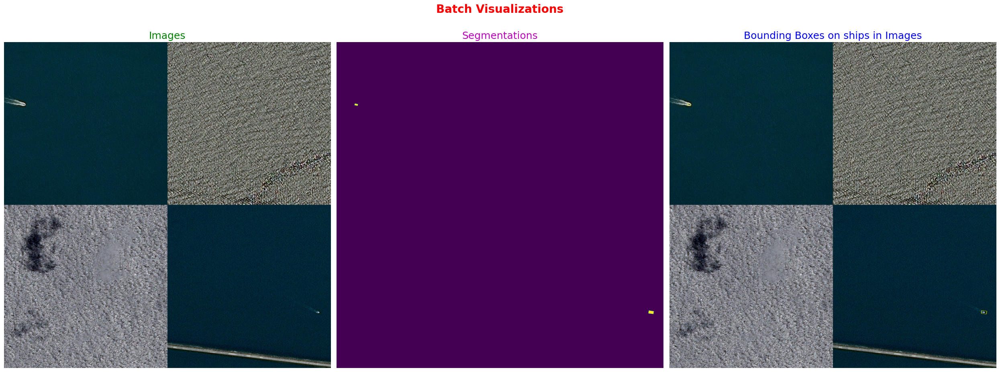

In [57]:
# Visulaising train batch
montage_rgb = lambda x: np.stack([montage(x[:, :, :, i]) for i in range(x.shape[3])], -1)
batch_rgb = montage_rgb(train_x)                                                   # Create montage of img
batch_seg = montage(train_y[:, :, :, 0])                                           # Create montafe of msk
batch_overlap = mark_boundaries(batch_rgb, batch_seg.astype(int))                  # Create bounding box around ships in img
titles = ["Images", "Segmentations", "Bounding Boxes on ships in Images"]          # Titles for subplot
colors = ['g', 'm', 'b']                                                           # Colors to be used for title
display = [batch_rgb, batch_seg, batch_overlap]                                    # What to display in subplot
plt.figure(figsize=(25,10))                                                        # Generate figure 
for i in range(3):                                                                 # For i = 0, 1, 2, 3                           
    plt.subplot(1, 3, i+1)                                                         # Create subplot
    plt.imshow(display[i])                                                         # Display 
    plt.title(titles[i], fontsize = 18, color = colors[i])                         # Title 
    plt.axis('off')                                                                # Turn off the axis
plt.suptitle("Batch Visualizations", fontsize = 20, color = 'r', weight = 'bold')  # Add suptitle
plt.tight_layout()                                                                 # Layout for subplot

In [58]:
# Prepare validation data
valid_x, valid_y = next(make_image_gen(valid_df, VALID_IMG_COUNT))
print(f"valid_x ~\nShape: {valid_x.shape}\nMin value: {valid_x.min()}\nMax value: {valid_x.max()}")
print(f"\nvalid_y ~\nShape: {valid_y.shape}\nMin value: {valid_y.min()}\nMax value: {valid_y.max()}")

valid_x ~
Shape: (400, 768, 768, 3)
Min value: 0.0
Max value: 1.0

valid_y ~
Shape: (400, 768, 768, 1)
Min value: 0
Max value: 1


In [59]:
#MY EXTRA CODE
print(f"valid_x ~\nShape: {valid_x.shape}\nType: {valid_x.dtype}\nMin value: {valid_x.min()}\nMax value: {valid_x.max()}")
print(f"\nvalid_y ~\nShape: {valid_y.shape}\nType: {valid_y.dtype}\nMin value: {valid_y.min()}\nMax value: {valid_y.max()}")
valid_x = valid_x.astype('float32')
valid_y = valid_y.astype('float32')
print(f"valid_x ~\nShape: {valid_x.shape}\nType: {valid_x.dtype}\nMin value: {valid_x.min()}\nMax value: {valid_x.max()}")
print(f"\nvalid_y ~\nShape: {valid_y.shape}\nType: {valid_y.dtype}\nMin value: {valid_y.min()}\nMax value: {valid_y.max()}")


valid_x ~
Shape: (400, 768, 768, 3)
Type: float64
Min value: 0.0
Max value: 1.0

valid_y ~
Shape: (400, 768, 768, 1)
Type: int16
Min value: 0
Max value: 1
valid_x ~
Shape: (400, 768, 768, 3)
Type: float32
Min value: 0.0
Max value: 1.0

valid_y ~
Shape: (400, 768, 768, 1)
Type: float32
Min value: 0.0
Max value: 1.0


IT THIS AUGUMENTATION: WHAT HAPPEND: WE CAN REMMOVE THAT

In [61]:
# Augmenting Data using ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Preparing image data generator arguments
dg_args = dict(rotation_range = 15,            # Degree range for random rotations
               horizontal_flip = True,         # Randomly flips the inputs horizontally
               vertical_flip = True,           # Randomly flips the inputs vertically
               data_format = 'channels_last')  # channels_last refer to (batch, height, width, channels)

- Click [here](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator) to find more information on ImageDataGenerator and its arguments.

In [63]:
image_gen = ImageDataGenerator(**dg_args)
label_gen = ImageDataGenerator(**dg_args)

def create_aug_gen(in_gen, seed = None):
    '''
    Takes in -
    in_gen - train data generator, seed value
    '''
    np.random.seed(seed if seed is not None else np.random.choice(range(9999)))  # Randomly assign seed value if not provided
    for in_x, in_y in in_gen:                                                    # For imgs and msks in train data generator
        seed = 12                                                                # Seed value for imgs and msks must be same else augmentation won't be same
        
        # Create augmented imgs
        g_x = image_gen.flow(255*in_x,                                           # Inverse scaling on imgs for augmentation                                       
                             batch_size = in_x.shape[0],                         # batch_size = 3
                             seed = seed,                                        # Seed
                             shuffle=True)                                       # Shuffle the data
        
        # Create augmented masks
        g_y = label_gen.flow(in_y,
                             batch_size = in_x.shape[0],                       
                             seed = seed,                                         
                             shuffle=True)                                       
        
        '''Yeilds - augmented scaled imgs and msks array'''
        yield next(g_x)/255.0, next(g_y)
    



In [64]:
#EXTRA CODE MINE

# Assuming aug_gen is created from create_aug_gen function
aug_gen = create_aug_gen(make_image_gen(balanced_train_df))

# Now, let's iterate over aug_gen to check the types and dtypes
for data in aug_gen:
    print(type(data[0]), type(data[1]))  # This should print <class 'numpy.ndarray'> for both
    print(data[0].dtype, data[1].dtype)  # This should print 'float32' for images and 'float32' or 'int32' for masks
    break  # We break after one iteration just for checking


<class 'numpy.ndarray'> <class 'numpy.ndarray'>
float32 float32


In [65]:
for imgs, masks in aug_gen:
    print(f"Images batch - type: {imgs.dtype}, shape: {imgs.shape}")
    print(f"Masks batch - type: {masks.dtype}, shape: {masks.shape}")
    break  # Just check one batch


Images batch - type: float32, shape: (4, 768, 768, 3)
Masks batch - type: float32, shape: (4, 768, 768, 1)


In [66]:
# Augment the train data
cur_gen = create_aug_gen(train_gen, seed = 42)
t_x, t_y = next(cur_gen)
print('x', t_x.shape, t_x.dtype, t_x.min(), t_x.max())
print('y', t_y.shape, t_y.dtype, t_y.min(), t_y.max())

x (4, 768, 768, 3) float32 0.0 0.9968065
y (4, 768, 768, 1) float32 0.0 1.0


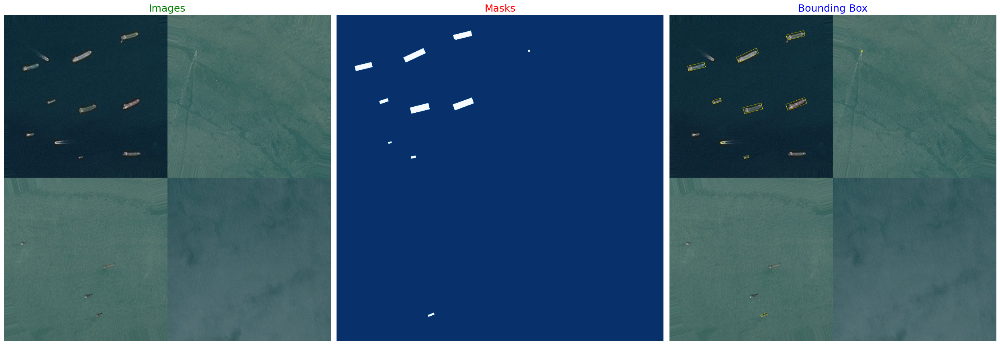

In [67]:
# Final display before passing data into model
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (25, 10))
ax1.imshow(montage_rgb(t_x), cmap='gray')
ax1.set_title('Images', fontsize = 18, color = 'g')
ax1.axis('off')
ax2.imshow(montage(t_y[:, :, :, 0]), cmap='Blues_r')
ax2.set_title('Masks', fontsize = 18, color = 'r')
ax2.axis('off')
ax3.imshow(mark_boundaries(montage_rgb(t_x), montage(t_y[:, :, :, 0].astype(int))))
ax3.set_title('Bounding Box', fontsize = 18, color = 'b')
ax3.axis('off')
plt.tight_layout()

In [68]:
gc.collect() # Block all the garbage that has been generated

65

In [76]:
# Build U-Net model
from keras import models, layers

# Conv2DTranspose upsampling
def upsample_conv(filters, kernel_size, strides, padding):
    return layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding=padding)
# Upsampling without Conv2DTranspose
def upsample_simple(filters, kernel_size, strides, padding):
    return layers.UpSampling2D(strides)

# Upsampling method choice
if UPSAMPLE_MODE=='DECONV':
    upsample=upsample_conv
else:
    upsample=upsample_simple

# Building the layers of UNET
input_img = layers.Input(t_x.shape[1:], name = 'RGB_Input')
pp_in_layer = input_img

# If NET_SCALING is defined then do the next step else continue ahead
if NET_SCALING is not None:
    pp_in_layer = layers.AvgPool2D(NET_SCALING)(pp_in_layer)

# To avoid overfitting and fastening the process of training
pp_in_layer = layers.GaussianNoise(GAUSSIAN_NOISE)(pp_in_layer)                       # Useful to mitigate overfitting
pp_in_layer = layers.BatchNormalization()(pp_in_layer)                                # Allows using higher learning rate without causing problems with gradients


## Downsample (C-->C-->MP)

c1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (pp_in_layer)
c1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (c1)
p1 = layers.MaxPooling2D((2, 2)) (c1)

c2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (p1)
c2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (c2)
p2 = layers.MaxPooling2D((2, 2)) (c2)

c3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (p2)
c3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (c3)
p3 = layers.MaxPooling2D((2, 2)) (c3)

c4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (p3)
c4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (c4)
p4 = layers.MaxPooling2D(pool_size=(2, 2)) (c4)


c5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (p4)
c5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (c5)

## Upsample (U --> Concat --> C --> C)

u6 = upsample(64, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = layers.concatenate([u6, c4])
c6 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (u6)
c6 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (c6)

u7 = upsample(32, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = layers.concatenate([u7, c3])
c7 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (u7)
c7 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (c7)

u8 = upsample(16, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = layers.concatenate([u8, c2])
c8 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (u8)
c8 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (c8)

u9 = upsample(8, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = layers.concatenate([u9, c1], axis=3)
c9 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (u9)
c9 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (c9)

d = layers.Conv2D(1, (1, 1), activation='sigmoid') (c9)
d = layers.Cropping2D((EDGE_CROP, EDGE_CROP))(d)
d = layers.ZeroPadding2D((EDGE_CROP, EDGE_CROP))(d)

if NET_SCALING is not None:
    d = layers.UpSampling2D(NET_SCALING)(d)

seg_model = models.Model(inputs=[input_img], outputs=[d])

seg_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ RGB_Input           │ (None, 768, 768,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise      │ (None, 768, 768,  │          0 │ RGB_Input[0][0]   │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 768, 768,  │         12 │ gaussian_noise[0… │
│ (BatchNormalizatio… │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 768, 768,  │        224 │ batch_normalizat… │
│                     │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 768, 768,  │        584 │ conv2d[0][0]      │
│                     │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 384, 384,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 384, 384,  │      1,168 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 384, 384,  │      2,320 │ conv2d_2[0][0]    │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 192, 192,  │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 192, 192,  │      4,640 │ max_pooling2d_1[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 192, 192,  │      9,248 │ conv2d_4[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 96, 96,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 96, 96,    │     18,496 │ max_pooling2d_2[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 96, 96,    │     36,928 │ conv2d_6[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 48, 48,    │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 48, 48,    │     73,856 │ max_pooling2d_3[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 48, 48,    │    147,584 │ conv2d_8[0][0]  

 Total params: 491,149 (1.87 MB)

 Trainable params: 491,143 (1.87 MB)

 Non-trainable params: 6 (24.00 B)

Epoch 1/2
10/10 ━━━━━━━━━━━━━━━━━━━━ 248s 26s/step - loss: 0.6787 - mean_iou: 0.1087 - val_loss: 0.6402 - val_mean_iou: 0.1192
Epoch 2/2
10/10 ━━━━━━━━━━━━━━━━━━━━ 234s 25s/step - loss: 0.6334 - mean_iou: 0.1187 - val_loss: 0.6299 - val_mean_iou: 0.2336


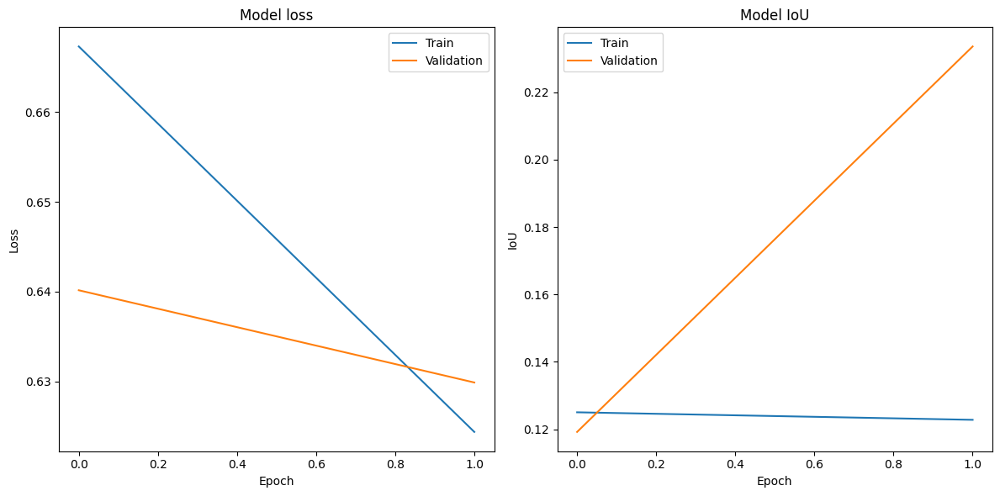

In [78]:

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Define MeanIoU metric globally
mean_iou_metric = tf.metrics.MeanIoU(num_classes=2)

# Custom metric function
def mean_iou(y_true, y_pred):
    y_pred = K.cast(y_pred > 0.5, 'float32')  # Threshold at 0.5
    mean_iou_metric.update_state(y_true, y_pred)
    return mean_iou_metric.result()

# Compile the model
seg_model.compile(optimizer=Adam(learning_rate=1e-4), 
                  loss='binary_crossentropy', 
                  metrics=[mean_iou])

# Define model checkpoint
checkpoint = ModelCheckpoint('model.keras', save_best_only=True, monitor='val_loss', mode='min')

# Define early stopping
early_stopping = EarlyStopping(patience=10, monitor='val_loss', mode='min')

# Train the model
history = seg_model.fit(train_gen, 
                        steps_per_epoch=MAX_TRAIN_STEPS, 
                        epochs=NB_EPOCHS, 
                        validation_data=(valid_x, valid_y), 
                        callbacks=[checkpoint, early_stopping])

# Save the trained model
seg_model.save('unet_ship_segmentation.keras')

# Reset the metric state before use
mean_iou_metric.reset_state()

# Plotting training history
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot training & validation loss values
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')

# Plot training & validation IoU values
plt.subplot(1, 2, 2)
plt.plot(history.history['mean_iou'])
plt.plot(history.history['val_mean_iou'])
plt.title('Model IoU')
plt.ylabel('IoU')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

Epoch 1/2
10/10 ━━━━━━━━━━━━━━━━━━━━ 238s 25s/step - loss: 0.5316 - mean_iou: 0.4821 - val_loss: 0.5812 - val_mean_iou: 0.4996
Epoch 2/2
10/10 ━━━━━━━━━━━━━━━━━━━━ 226s 24s/step - loss: 0.1584 - mean_iou: 0.5004 - val_loss: 0.2967 - val_mean_iou: 0.5004


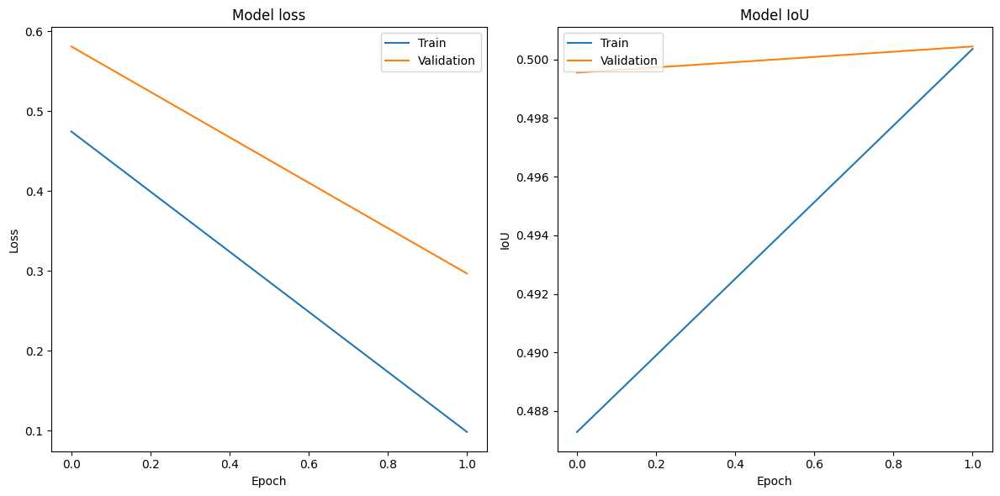

In [83]:
#this the CODEE is hidden
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.mixed_precision import set_global_policy

#Enable mixed precision
set_global_policy('mixed_float16')

#Define MeanIoU metric globally
mean_iou_metric = tf.metrics.MeanIoU(num_classes=2)

#Custom metric function
def mean_iou(y_true, y_pred):
    y_pred = K.cast(y_pred > 0.5, 'float32')  # Threshold at 0.5
    mean_iou_metric.update_state(y_true, y_pred)
    return mean_iou_metric.result()

#Compile the model
seg_model.compile(optimizer=Adam(learning_rate=1e-4), 
                  loss='binary_crossentropy', 
                  metrics=[mean_iou])

#Define model checkpoint
checkpoint = ModelCheckpoint('model.keras', save_best_only=True, monitor='val_loss', mode='min')

#Define early stopping
early_stopping = EarlyStopping(patience=10, monitor='val_loss', mode='min')

#Prepare data pipeline
def preprocess(image, mask):
    image = tf.cast(image, tf.float32) / 255.0
    mask = tf.cast(mask, tf.float32) / 255.0
    return image, mask

def generator_wrapper():
    for (image, mask) in train_gen:
        yield image, mask

BATCH_SIZE = 4  # Example batch size, set according to your needs

train_dataset = tf.data.Dataset.from_generator(
    generator_wrapper, 
    output_signature=(
        tf.TensorSpec(shape=(BATCH_SIZE, 768, 768, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(BATCH_SIZE, 768, 768, 1), dtype=tf.float32)
    )
).prefetch(tf.data.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((valid_x, valid_y))
val_dataset = val_dataset.map(preprocess).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

#Train the model
history = seg_model.fit(train_dataset, 
                        steps_per_epoch=MAX_TRAIN_STEPS, 
                        epochs=NB_EPOCHS, 
                        validation_data=val_dataset, 
                        callbacks=[checkpoint, early_stopping])

#Save the trained model
seg_model.save('unet_ship_segmentation.keras')

#Reset the metric state before use
#mean_iou_metric.reset_states()

#Plotting training history
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

#Plot training & validation loss values
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')

#Plot training & validation IoU values
plt.subplot(1, 2, 2)
plt.plot(history.history['mean_iou'])
plt.plot(history.history['val_mean_iou'])
plt.title('Model IoU')
plt.ylabel('IoU')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

#  **USELESS BLOCK**

13/13 ━━━━━━━━━━━━━━━━━━━━ 154s 12s/step


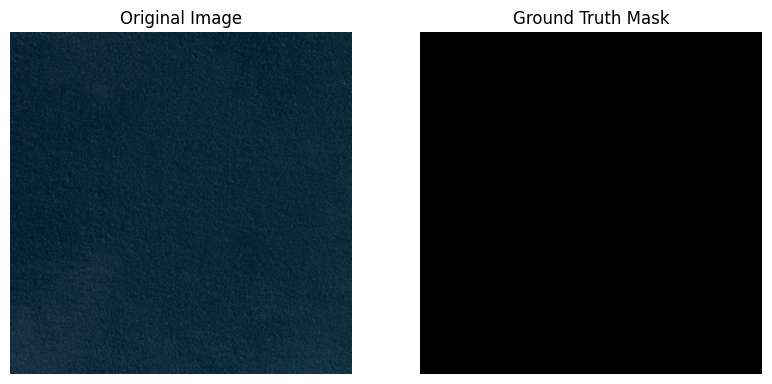

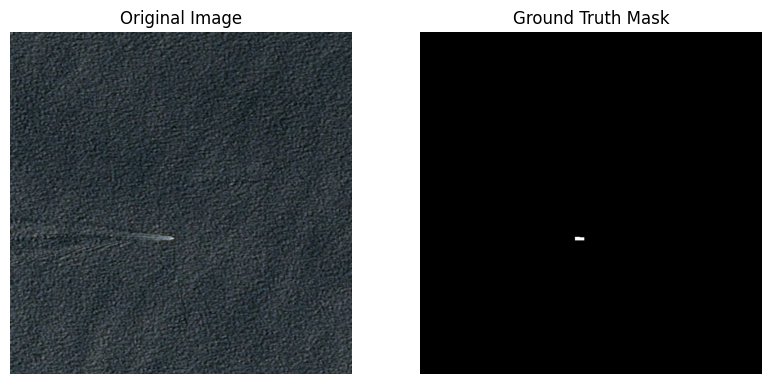

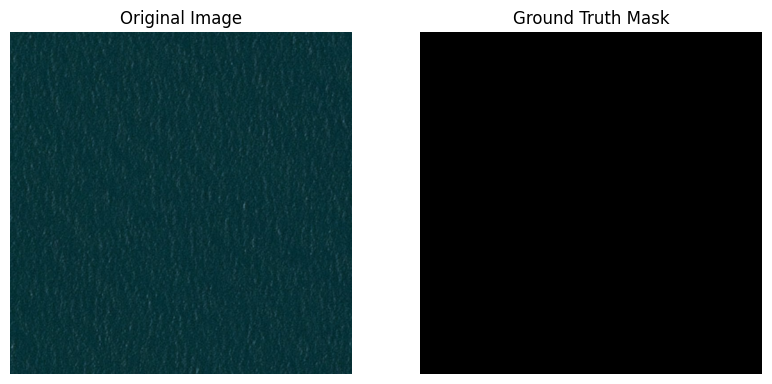

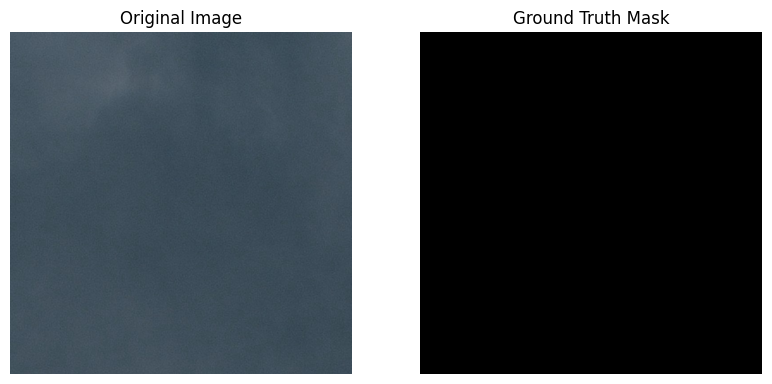

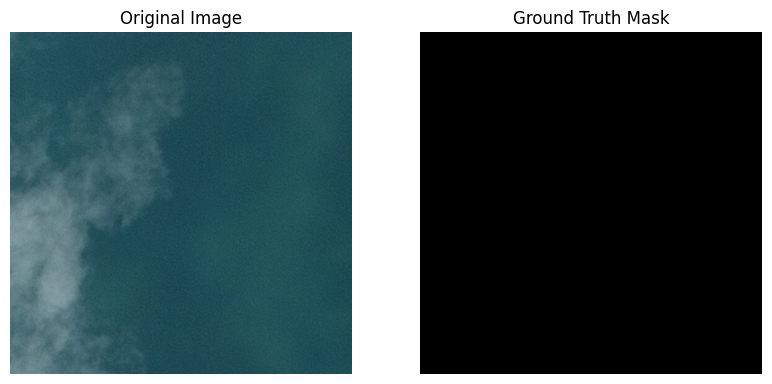

In [80]:
# Visualizing predictions on validation set
valid_pred = seg_model.predict(valid_x)

# Function to plot original image, ground truth, and predicted mask
def plot_predictions(images, masks, predictions, index):
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(images[index])
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[index].squeeze(), cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

# Plotting a 
#few example predictions
for i in range(5):
    plot_predictions(valid_x, valid_y, valid_pred, i)

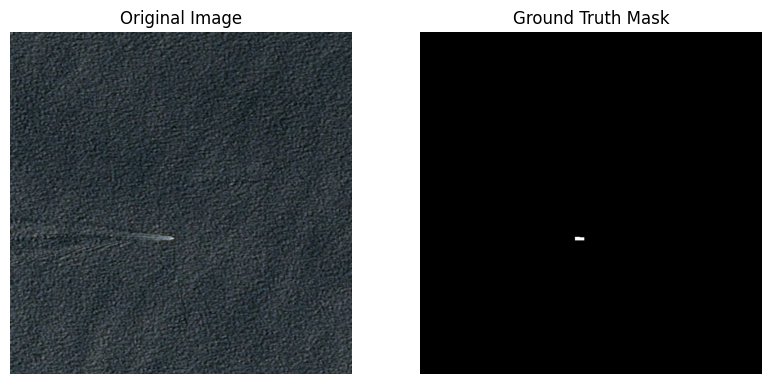

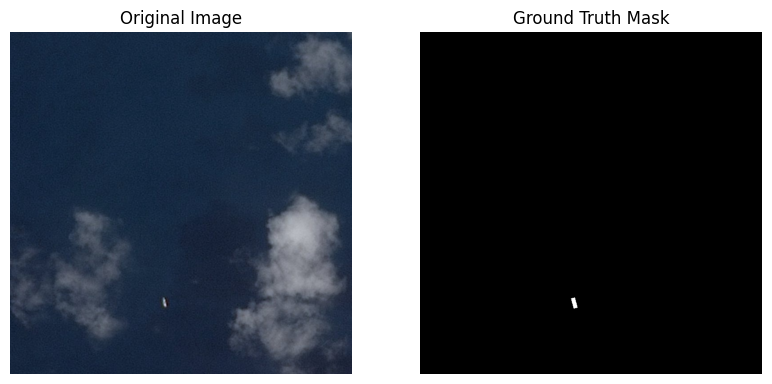

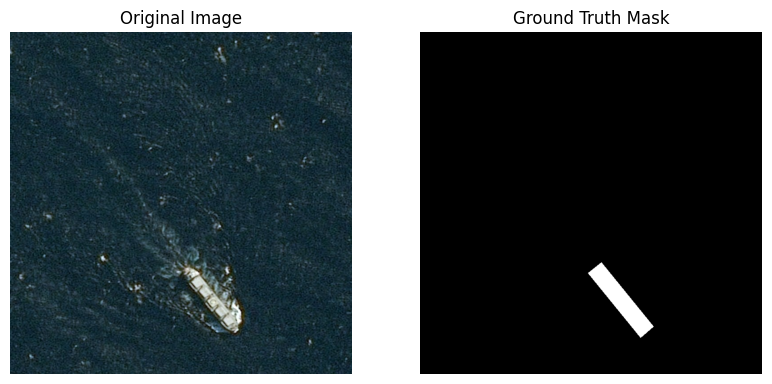

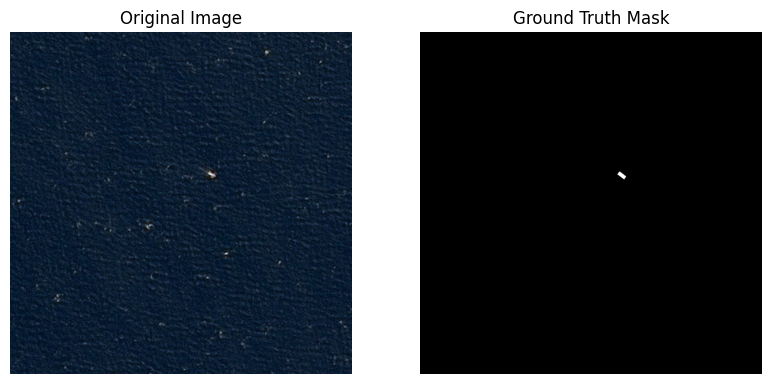

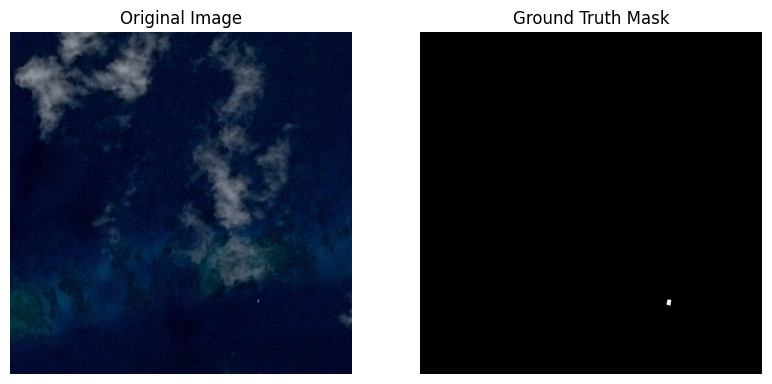

In [81]:
import matplotlib.pyplot as plt

# Assuming valid_x, valid_y, valid_pred are already defined
# valid_x: array of original images
# valid_y: array of ground truth masks
# valid_pred: array of predicted masks

# Function to plot original image, ground truth, and predicted mask
def plot_predictions(images, masks, predictions, index):
    plt.figure(figsize=(15, 5))
    
    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(images[index])
    plt.title('Original Image')
    plt.axis('off')

    # Ground Truth Mask
    plt.subplot(1, 3, 2)
    plt.imshow(masks[index].squeeze(), cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

# Assuming valid_x, valid_y, valid_pred have been defined
# Now, let's filter images that contain ships
images_with_ships = []
for i in range(len(valid_x)):
    # Assuming valid_y contains the ground truth masks
    if valid_y[i].sum() > 0:  # Check if there are any ship pixels in the ground truth mask
        images_with_ships.append(i)

# Plotting a few example predictions for images that contain ships
num_examples = min(5, len(images_with_ships))  # Plot up to 5 examples or fewer if there are less than 5 images with ships
for i in range(num_examples):
    plot_predictions(valid_x, valid_y, valid_pred, images_with_ships[i])

plt.show()


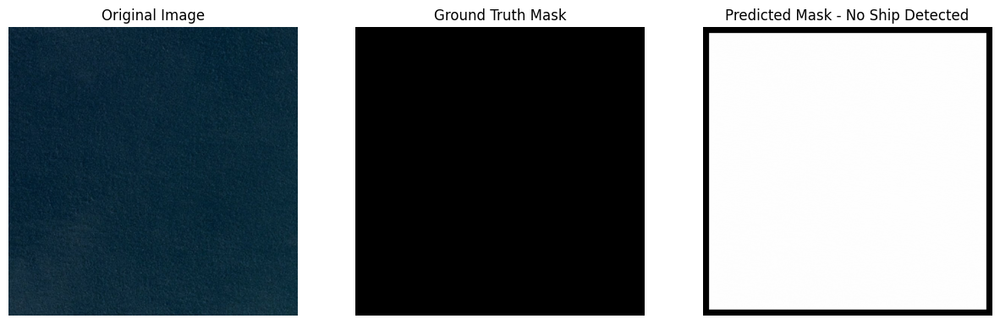

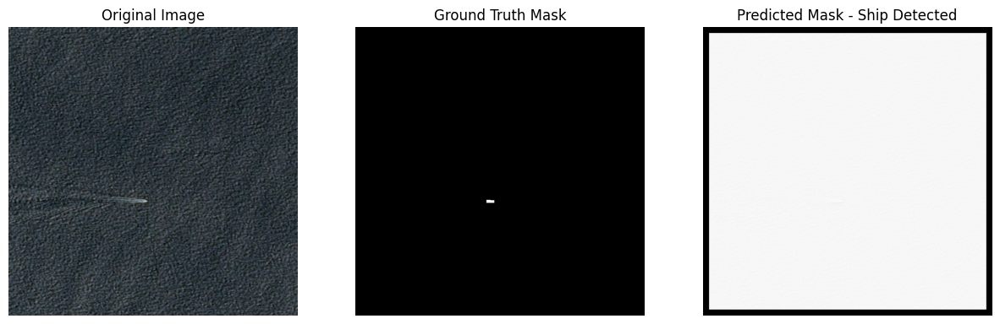

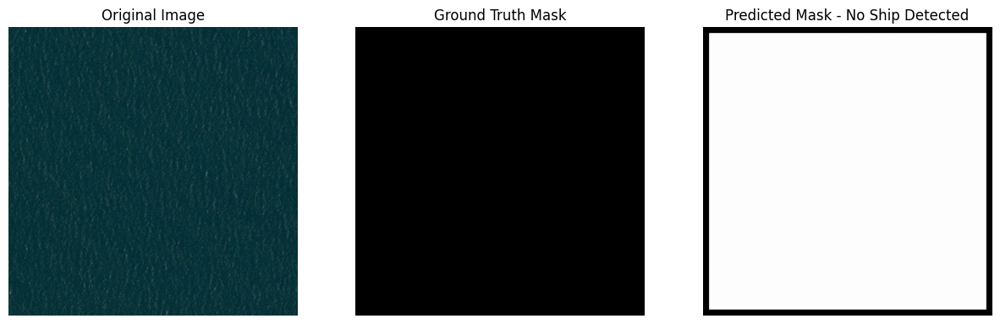

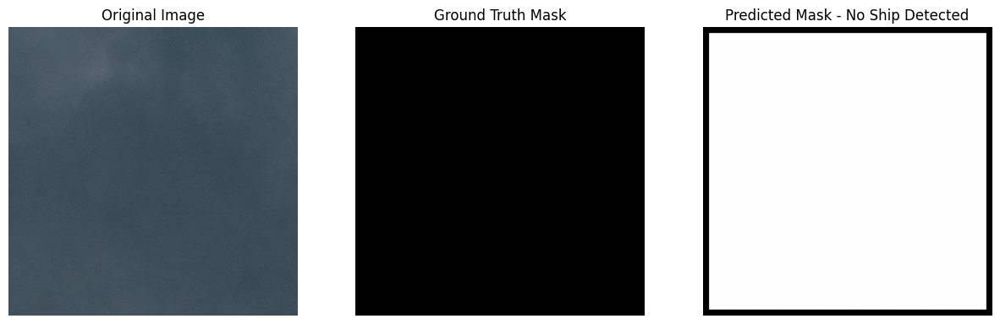

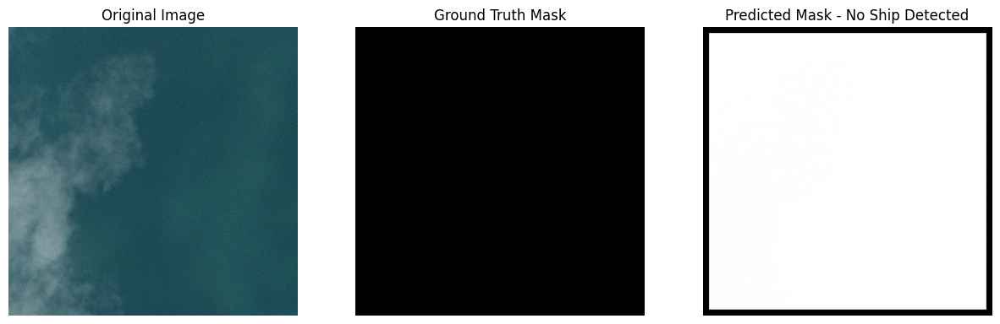

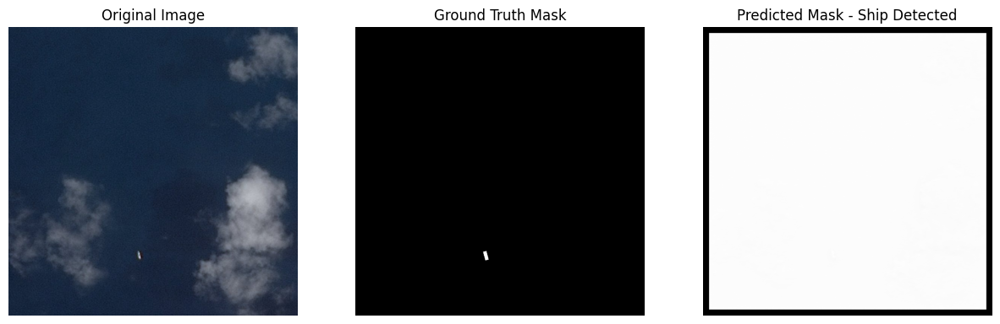

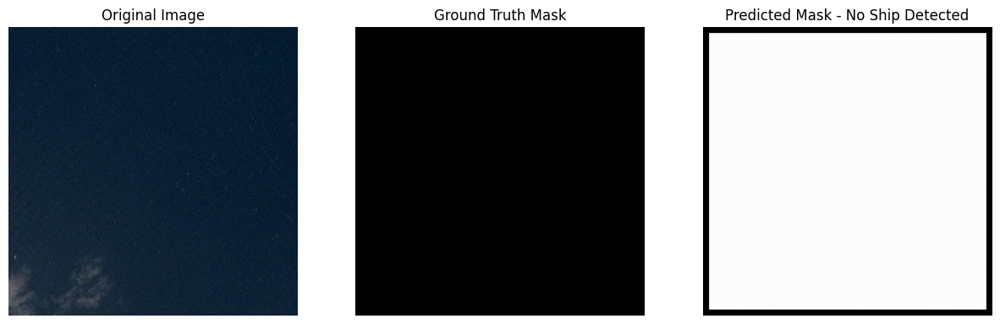

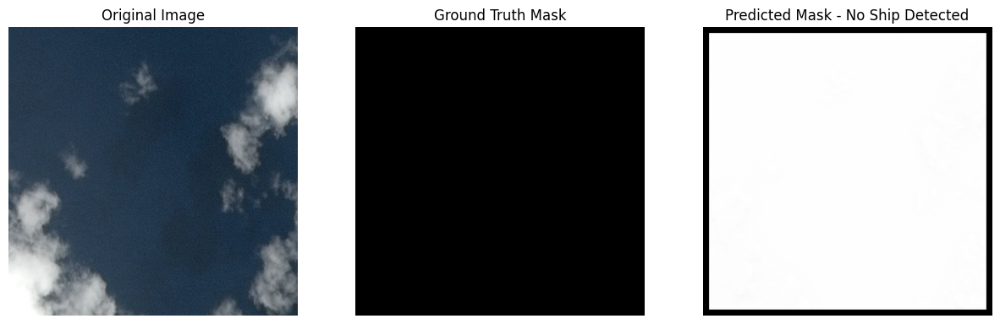

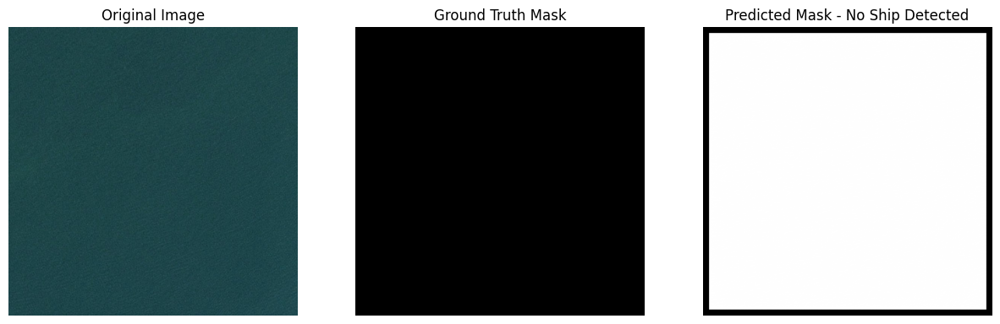

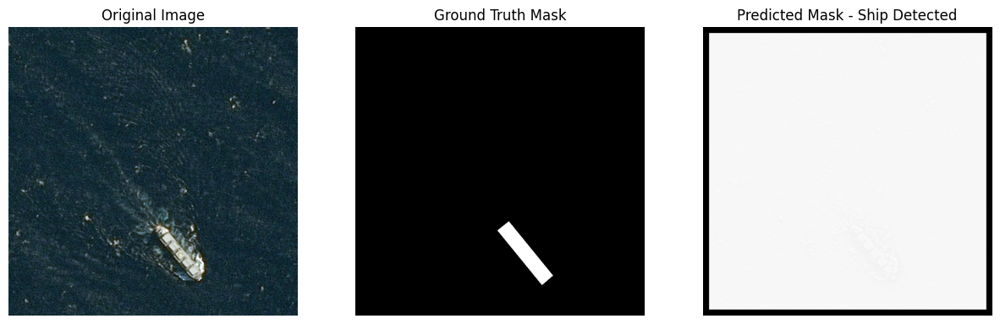

In [82]:
import numpy as np
import matplotlib.pyplot as plt

# Function to determine if a ship is detected based on ground truth mask
def is_ship_detected(ground_truth_mask):
    # Check if any pixel in the ground truth mask is 1
    return np.any(ground_truth_mask > 0.5)

# Function to plot original image, ground truth, and predicted mask
def plot_predictions(images, ground_truth_masks, predicted_masks, index):
    plt.figure(figsize=(15, 5))
    
    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(images[index])
    plt.title('Original Image')
    plt.axis('off')

    # Ground Truth Mask
    plt.subplot(1, 3, 2)
    plt.imshow(ground_truth_masks[index].squeeze(), cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

    # Predicted Mask
    plt.subplot(1, 3, 3)
    plt.imshow(predicted_masks[index].squeeze(), cmap='gray')
    
    # Check if ship is detected in ground truth mask
    if is_ship_detected(ground_truth_masks[index]):
        plt.title('Predicted Mask - Ship Detected')
    else:
        plt.title('Predicted Mask - No Ship Detected')
        
    plt.axis('off')
    
    plt.show()

# Example usage assuming valid_x, valid_y, and valid_pred are defined
# Plotting a few example predictions
for i in range(10):
    plot_predictions(valid_x, valid_y, valid_pred, i)


ERROR OCCURED AT THIS POOINT